#CVPR Project 1 (Calibration)



In [272]:
from matplotlib import pyplot as plt
import os
import numpy as np
import cv2
from google.colab import drive

## Load images (load only one set of images at a time)

### Load assignment images

In [273]:
drive.mount('/content/drive/', force_remount=True)
GDrivePath = '/content/drive/MyDrive/'
folderpath = GDrivePath + 'CameraCalibrationProject/images/images/'

Mounted at /content/drive/


In [275]:
images = []

for i in range(20):
    filepath = folderpath + f'image{i:02}.tiff'
    image = cv2.imread(filepath)
    images.append(image)

images_array = np.array(images)

grid_size = (8, 11)
rows, cols = 8,11
square_size = 11

rect_width = 99
rect_height = 44
parallelepiped_depth = 60

chosenImage = folderpath + 'image11.tiff'

###Load smartphone images

In [280]:
drive.mount('/content/drive/', force_remount=True)
GDrivePath = '/content/drive/MyDrive/'
folderpath = GDrivePath + 'CameraCalibrationProject/smartphoneImages/'

Mounted at /content/drive/


In [281]:
images = []

for i in range(20):
    filepath = folderpath + f'colored_image{i:02}.jpg'
    image = cv2.imread(filepath)
    images.append(image)


images_array = np.array(images)

grid_size = (7, 10)
rows, cols = 7,10
square_size = 20

rect_width = 180
rect_height = 80
parallelepiped_depth = 60

chosenImage = folderpath + 'colored_image11.jpg'

## Detect and display checkerboard corners


In [282]:
criteria = (cv2.TERM_CRITERIA_MAX_ITER | cv2.TERM_CRITERIA_EPS, 100, 0.001)
corners_array = []

for idx, image in enumerate(images_array):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return_value, corners = cv2.findChessboardCorners(gray, patternSize=grid_size)

    if return_value:
        corners = cv2.cornerSubPix(gray, corners, (5, 5), (-1, -1), criteria)
        corners_array.append(corners.reshape(-1, 2))
    else:
        print(f"Warning: Chessboard corners NOT found in image {idx}")
        corners_array.append(None)

corners_array = np.array(corners_array)

In [ ]:
for idx, (image, corners) in enumerate(zip(images_array, corners_array)):
  image_copy = image.copy()
  cv2.drawChessboardCorners(image_copy, grid_size, corners, True)

  plt.figure(figsize=(6.4 * 2, 4.8 * 2))
  plt.title(f"Image {idx} with Chessboard Corners")
  plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))
  plt.axis('off')
  plt.show()

## Estimating homographies

In [284]:
homography_matrices = []
real_coordinates_array = []

for idx, corners in enumerate(corners_array):
  real_coordinates = np.empty_like(corners)
  for index, corner in enumerate(corners):
      grid_size_cv2 = tuple(reversed(grid_size))
      u_index, v_index = np.unravel_index(index, grid_size_cv2)
      x_mm = (u_index) * square_size
      y_mm = (v_index) * square_size
      real_coordinates[index, :] = [x_mm , y_mm]

  real_coordinates_array.append(real_coordinates)

def compute_homography_matrices(corners_array, coordinates_3D_array):
  homographies = []
  for idx, (corners, coordinates_3D) in enumerate(zip(corners_array, coordinates_3D_array)):
    A = np.empty((0, 9), dtype=float)
    for index, (corner, point_3D) in enumerate(zip(corners, coordinates_3D)):
      u_coord = corner[0]
      v_coord = corner[1]
      x_mm = point_3D[0]
      y_mm = point_3D[1]

      m = np.array([x_mm, y_mm, 1]).reshape(1, 3)
      O = np.array([0, 0, 0]).reshape(1, 3)
      A = np.vstack((A, np.hstack((m, O, -u_coord * m))))
      A = np.vstack((A, np.hstack((O, m, -v_coord * m))))

    U, S, V_transposed = np.linalg.svd(A)
    h = V_transposed.transpose()[:, -1]
    H = h.reshape(3, 3)
    homographies.append(H)
  return np.array(homographies, dtype=object)

homography_matrices = compute_homography_matrices(corners_array, real_coordinates_array)

for idx, H in enumerate(homography_matrices):
    print(f"Image {idx}: Homography Matrix:\n{H}")

Image 0: Homography Matrix:
[[4.643390801937779e-06 0.00175062746657522 -0.39060608459941437]
 [0.0012794725540183963 0.00012321885843531824 -0.9205551598044145]
 [-2.5451603540639455e-07 2.435052060648634e-07 -0.0006062015088796482]]
Image 1: Homography Matrix:
[[-1.7712335831505064e-05 0.0017415032146151533 -0.6726898059540772]
 [0.0013687232170829706 0.00027150931902597997 -0.7399210466756623]
 [-1.84139480240221e-07 3.014103979801506e-07 -0.0005379442397175238]]
Image 2: Homography Matrix:
[[0.002336216786421349 -0.00032470128441819076 0.1796871758298296]
 [-0.0007245601889171284 -0.001663098443994314 0.983719055899621]
 [3.6522111702174445e-08 5.242141360853224e-07 0.0006954698284526115]]
Image 3: Homography Matrix:
[[0.004460366982255296 0.002109247184346085 0.7516482997118286]
 [0.002133209381169502 -0.003399101662012048 0.659532173608864]
 [3.900182227009111e-07 6.973867474824661e-07 0.0013027827035680718]]
Image 4: Homography Matrix:
[[0.00039110927543214237 -0.001342553351758

In [ ]:
for idx, (H, corners, real_coordinates) in enumerate(zip(homography_matrices, corners_array, real_coordinates_array)):
  projected_points = []
  for real_point in real_coordinates:
    X, Y = real_point
    point_homogeneous = np.array([X, Y, 1]).reshape(3, 1)
    projected = H @ point_homogeneous
    u, v, w = projected.flatten()
    projected_points.append((u / w, v / w))

  projected_points = np.array(projected_points)

  image = images_array[idx].copy()
  for projected_point, measured in zip(projected_points, corners):
    u_p, v_p = projected_point
    u_m, v_m = measured
    cv2.circle(image, (int(u_p), int(v_p)), 20, (0, 255, 0), -1)
    cv2.circle(image, (int(u_m), int(v_m)), 17, (0, 0, 255), -1)

  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title(f"Image {idx}: Detected vs. Projected Points")
  plt.axis("off")
  plt.show()


## Without radial distortion

### Estimate intrinsic and extrinsic parameters

In [286]:
def compute_v_ij(H, i, j):
  return np.array([
    H[0, i] * H[0, j],
    H[0, i] * H[1, j] + H[1, i] * H[0, j],
    H[1, i] * H[1, j],
    H[2, i] * H[0, j] + H[0, i] * H[2, j],
    H[2, i] * H[1, j] + H[1, i] * H[2, j],
    H[2, i] * H[2, j]
  ])

def find_intrinsic_parameters(homography_matrices):
  V = []
  for H in homography_matrices:
    v12 = compute_v_ij(H, 0, 1)
    v11 = compute_v_ij(H, 0, 0)
    v22 = compute_v_ij(H, 1, 1)
    V.append(v12)
    V.append(v11 - v22)
  V = np.array(V)

  _, _, S_transposed = np.linalg.svd(V)
  b = S_transposed.transpose()[:, -1]
  B11, B12, B22, B13, B23, B33 = b
  B = np.array([
        [B11, B12, B13],
        [B12, B22, B23],
        [B13, B23, B33]
    ], dtype=float)
  if not (np.all(np.linalg.eigvals(B) > 0)):
    B *= -1
  L = np.linalg.cholesky(B)
  K = np.linalg.inv(L.transpose())
  K /= K[2, 2]
  return K

K = find_intrinsic_parameters(homography_matrices)
print(f"Estimated Intrinsic Matrix K:\n{K}")


Estimated Intrinsic Matrix K:
[[1.55642718e+03 6.98260145e+00 7.83795354e+02]
 [0.00000000e+00 1.54942402e+03 9.98241358e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [287]:
def compute_extrinsic_parameters(H, K):
  K_inv = np.linalg.inv(K)
  h1, h2, h3 = H[:, 0], H[:, 1], H[:, 2]
  lambda_ = 1 / np.linalg.norm(K_inv @ h1)
  r1 = lambda_ * (K_inv @ h1)
  r2 = lambda_ * (K_inv @ h2)
  t = lambda_ * (K_inv @ h3)
  r3 = np.cross(r1, r2)
  R = np.column_stack((r1, r2, r3))
  U, _, V_transposed = np.linalg.svd(R)
  R_orthogonal = U @ V_transposed
  return R_orthogonal, t

rotation_matrices = []
translation_vectors = []

for idx, H in enumerate(homography_matrices):
  H = np.array(H, dtype=np.float64)
  R, t = compute_extrinsic_parameters(H, K)
  print(f"Image {idx}: Rotation Matrix R:\n{R}")
  print(f"Image {idx}: Translation Vector t:\n{t}")
  rotation_matrices.append(R)
  translation_vectors.append(t)

rotation_matrices = np.array(rotation_matrices, dtype=object)
translation_vectors = np.array(translation_vectors, dtype=object)

Image 0: Rotation Matrix R:
[[ 0.12830232  0.96972948  0.20775767]
 [ 0.96076797 -0.06959683 -0.2684794 ]
 [-0.24589311  0.23405344 -0.94061446]]
Image 0: Translation Vector t:
[  53.62794152 -197.68601191 -588.67333582]
Image 1: Rotation Matrix R:
[[ 0.0752975   0.95455528  0.28836523]
 [ 0.98074221 -0.0186313  -0.19441605]
 [-0.18020825  0.29745099 -0.93757554]]
Image 1: Translation Vector t:
[-157.30142277 -128.18700321 -526.52690658]
Image 2: Rotation Matrix R:
[[ 0.95036798 -0.29970336 -0.08353797]
 [-0.31034931 -0.89419272 -0.32264949]
 [ 0.02200009  0.33256169 -0.94282486]]
Image 2: Translation Vector t:
[-150.61501792  119.42499594  444.56655419]
Image 3: Rotation Matrix R:
[[ 0.91284007  0.3481464   0.21334734]
 [ 0.38584699 -0.906432   -0.17176477]
 [ 0.13358557  0.23911319 -0.96175869]]
Image 3: Translation Vector t:
[ -58.68690127 -141.74429858  446.39296833]
Image 4: Rotation Matrix R:
[[-0.02449742 -0.94610068 -0.32294485]
 [-0.84751805  0.19098322 -0.49521567]
 [ 0.53020

In [288]:
def compute_projection_matrix(K, R, t):
  t = t.reshape(3, 1)
  Rt = np.hstack((R, t))
  P = K @ Rt
  return P

perspective_projection_matrices = []

for idx, (R, t) in enumerate(zip(rotation_matrices, translation_vectors)):
  P = compute_projection_matrix(K, R, t)
  print(f"Image {idx}: Perspective projection matrix P:\n{P}")
  perspective_projection_matrices.append(P)

perspective_projection_matrices = np.array(perspective_projection_matrices)

Image 0: Perspective projection matrix P:
[[13.671993814927873 1692.2773564097242 -415.7642479828065
  -379311.80217550445]
 [1243.176298925005 125.80681822438204 -1354.9486832139694
  -893937.5253856336]
 [-0.24589311005342473 0.23405344104227918 -0.9406144614902126
  -588.6733358249231]]
Image 1: Perspective projection matrix P:
[[-17.203183396126875 1718.7063933288564 -287.40540764609955
  -658412.631773077]
 [1339.6942065790674 268.06009642532484 -1237.159576379221
  -724216.956067966]
 [-0.18020824593486076 0.29745098944085974 -0.937575542011274
  -526.5269065839856]]
Image 2: Perspective projection matrix P:
[[1494.2550858174882 -212.0499392665846 -871.2554425071193
  114861.78885438124]
 [-458.9012688576016 -1053.5068409143237 -1441.0876314268644
  628824.6780492606]
 [0.022000091782939955 0.33256169122771173 -0.9428248604535766
  444.5665541873097]]
Image 3: Perspective projection matrix P:
[[1528.1670667592423 722.9510727913846 -422.96175566463353
  257549.1021896618]
 [731.19

### Computing the reprojection error

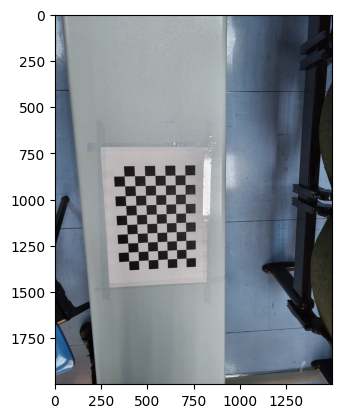

In [289]:
chosen_image = cv2.imread(chosenImage)
plt.imshow(chosen_image)

Total Reprojection Error: 39.46689977213332
Green: Measured Points
Red: Projected Points


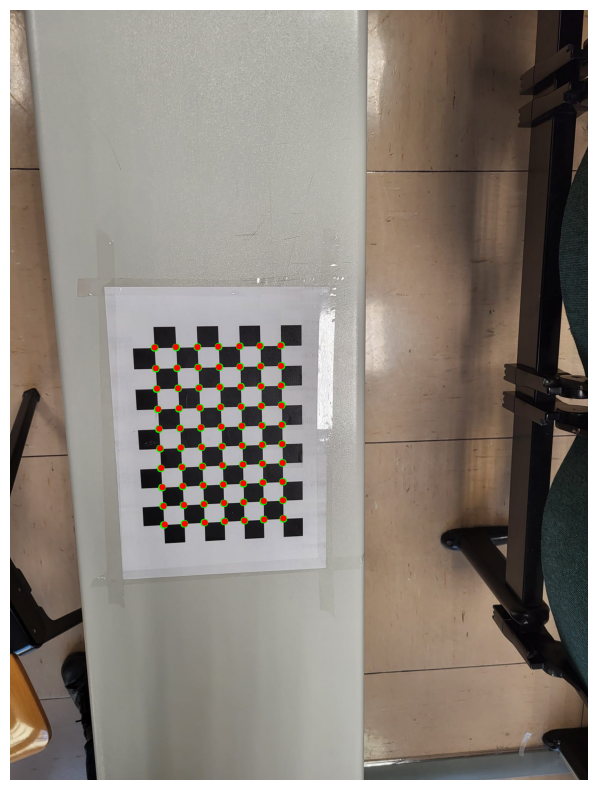

In [290]:
def compute_projected_points(P, coordinates_3D, z_coordinate):
  projected_points = []
  for m_i in coordinates_3D:
    m_i = np.array([m_i[0], m_i[1], z_coordinate, 1], dtype=np.float64)
    p1, p2, p3 = P[0], P[1], P[2]
    u_proj = (p1 @ m_i) / (p3 @ m_i)
    v_proj = (p2 @ m_i) / (p3 @ m_i)
    projected_points.append((u_proj, v_proj))
  return np.array(projected_points)

def compute_reprojection_error(coordinates_2D, projected_points):
  total_error = 0
  for i in range(len(coordinates_2D)):
    u_measured, v_measured = coordinates_2D[i]
    u_proj, v_proj = projected_points[i]
    error = (u_proj - u_measured) ** 2 + (v_proj - v_measured) ** 2
    total_error += error
  return total_error

def compare_points_in_image(image_original, coordinates_2D, projected_points):
  image = image_original.copy()
  coordinates_2D = np.array(coordinates_2D, dtype=np.int32)
  projected_points = np.array(projected_points, dtype=np.int32)
  for (u_measured, v_measured) in coordinates_2D:
    cv2.circle(image, (u_measured, v_measured), 10, (0, 255, 0), -1)
  for (u_proj, v_proj) in projected_points:
    cv2.circle(image, (u_proj, v_proj), 8, (0, 0, 255), -1)

  plt.figure(figsize=(15, 10))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.axis("off")
  plt.show()

projected_points_no_rd = compute_projected_points(perspective_projection_matrices[11], real_coordinates_array[11], 0)
total_reprojection_error = compute_reprojection_error(corners_array[11], projected_points_no_rd)
print("Total Reprojection Error:", total_reprojection_error)
print("Green: Measured Points")
print("Red: Projected Points")
compare_points_in_image(chosen_image, corners_array[11], projected_points_no_rd)


### Superimpose a parallelepiped to the calibration images

Blue: Bottom face
Green: Top face
Red: Sides that join the faces


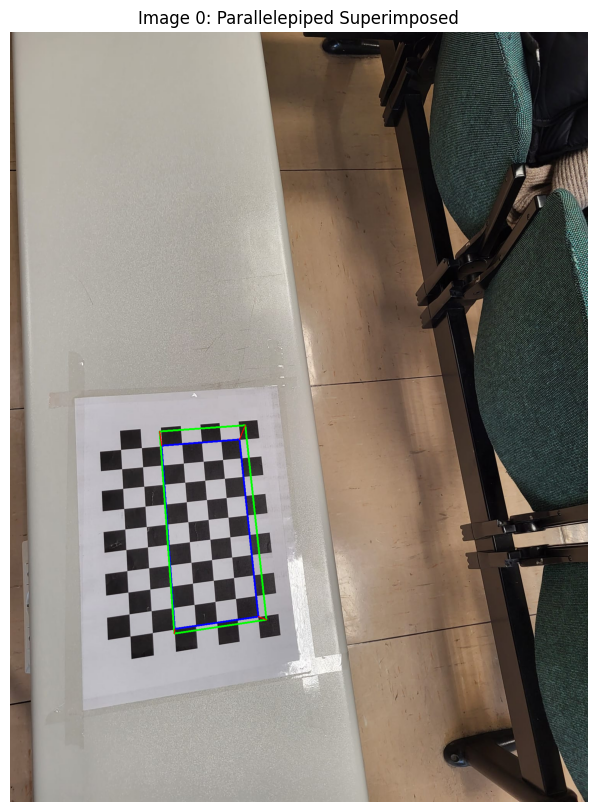

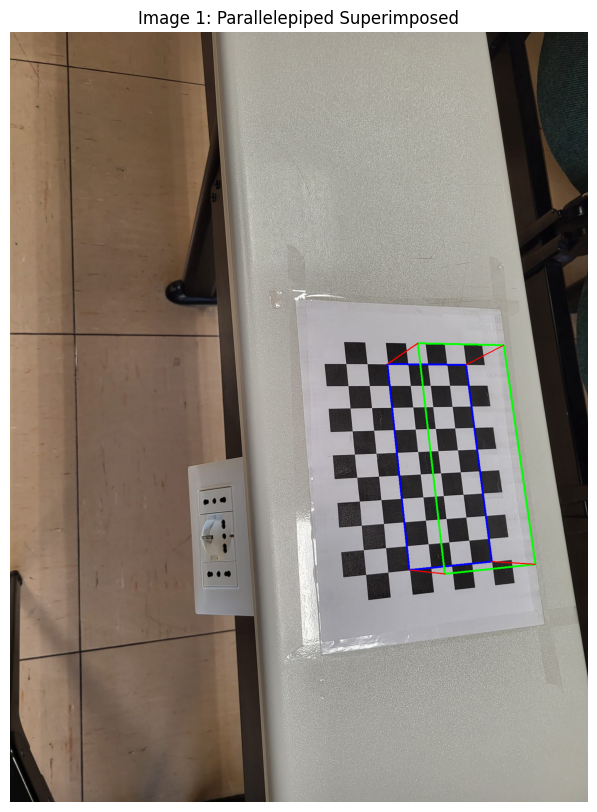

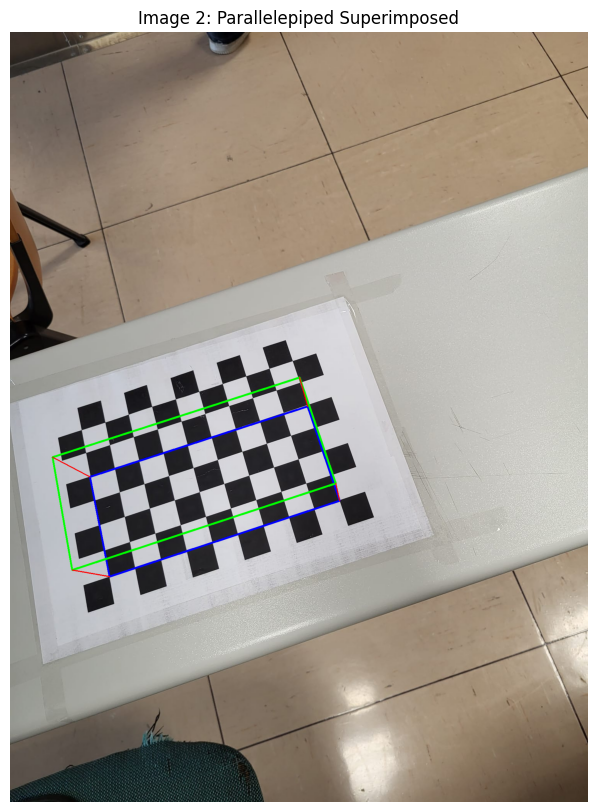

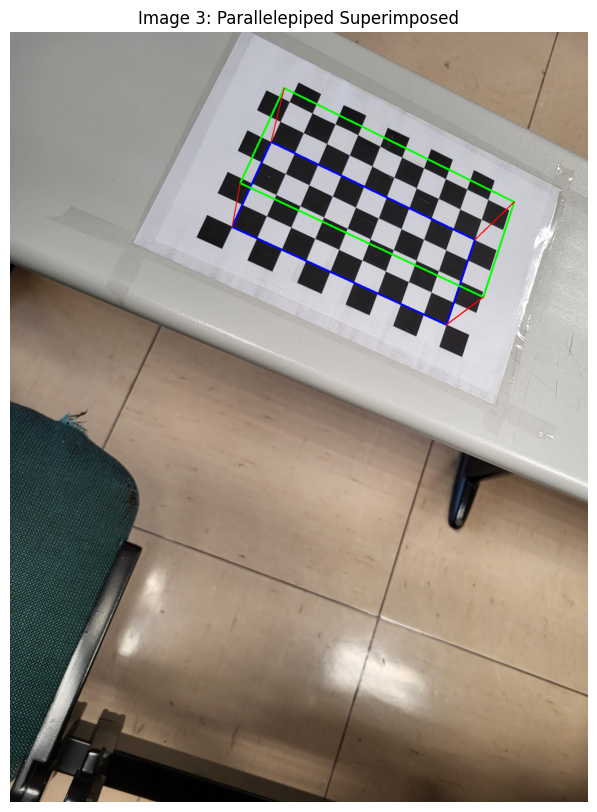

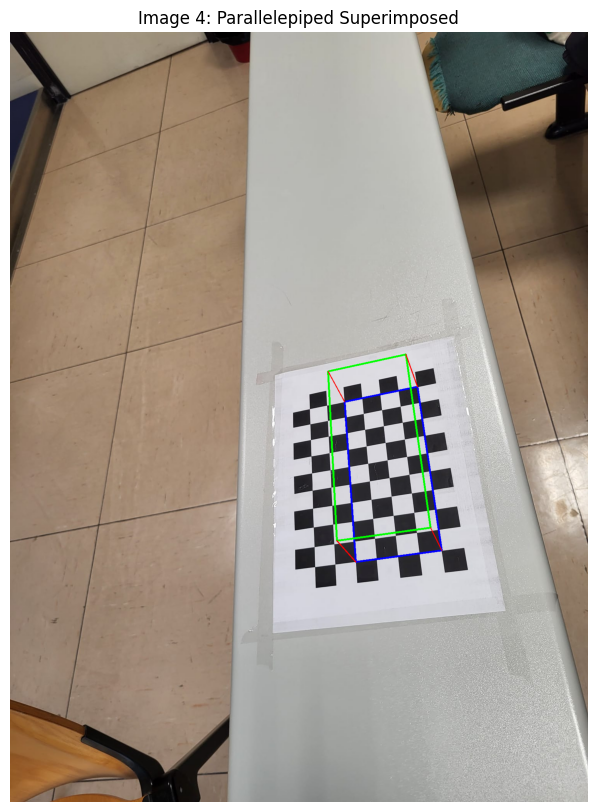

...

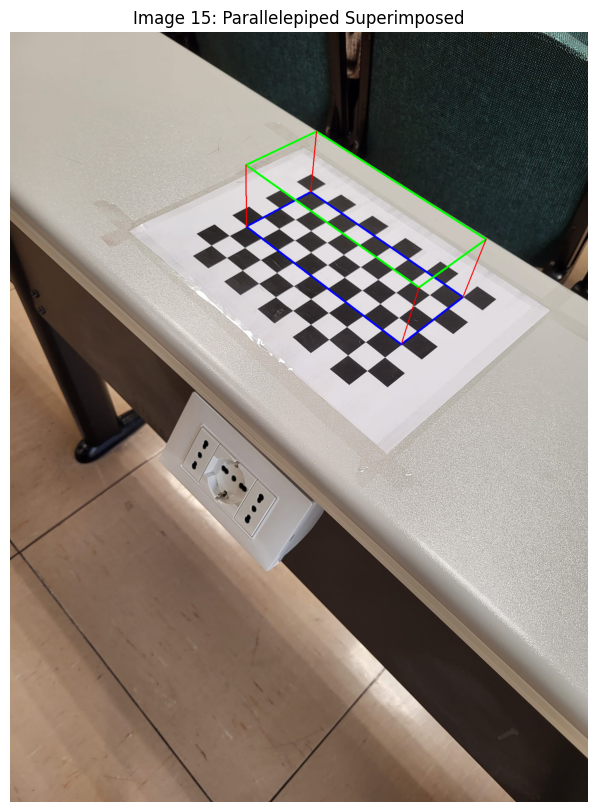

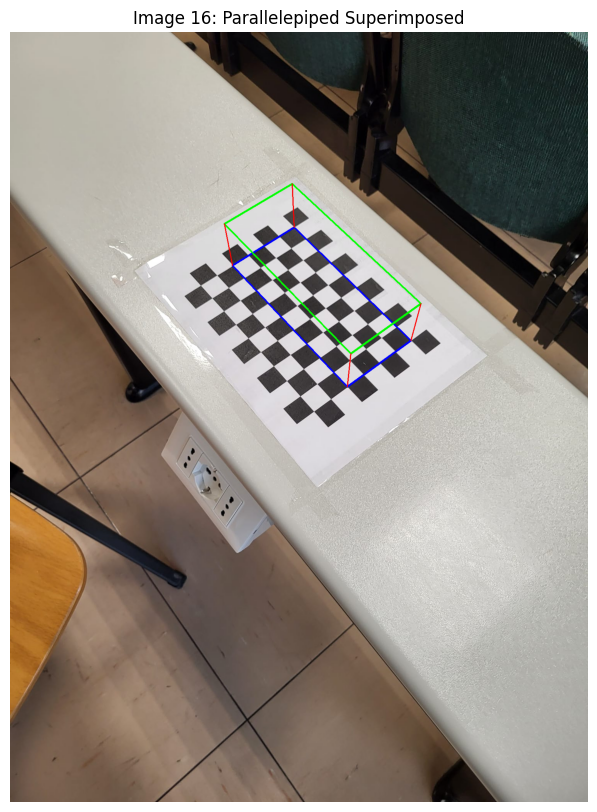

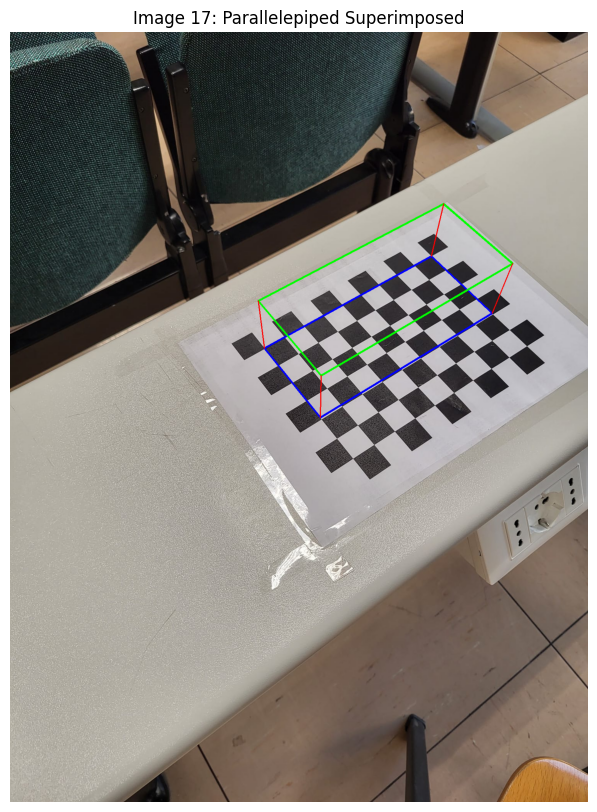

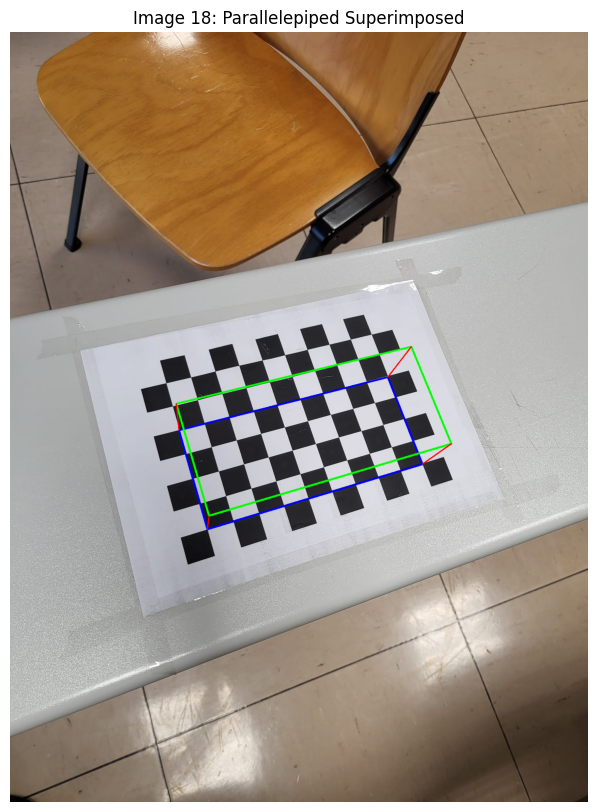

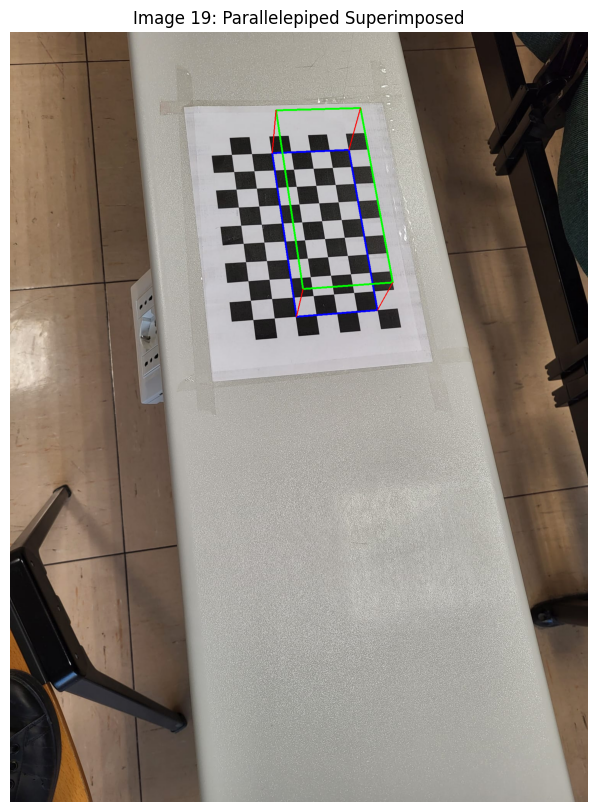

In [291]:
parallelepiped_face = np.array([
    [0, 0],
    [rect_width, 0],
    [rect_width, rect_height],
    [0, rect_height],
], dtype=np.float32)
bottom_z = 0
top_z = parallelepiped_depth

projected_parallelepiped_array = []

for idx, perspective_projection_matrix in enumerate(perspective_projection_matrices):
  corrected_top_z = top_z
  if (square_size == 11):
    if (idx in {2, 4, 8, 9, 10, 14}):
      corrected_top_z = - top_z
  if (square_size == 20):
    if (idx in {0, 1, 7, 11, 13, 14, 15, 16, 17, 19}):
      corrected_top_z = - top_z
  projected_bottom = compute_projected_points(perspective_projection_matrix, parallelepiped_face, bottom_z)
  projected_top = compute_projected_points(perspective_projection_matrix, parallelepiped_face, corrected_top_z)
  projected_parallelepiped = np.vstack((projected_bottom, projected_top))
  projected_parallelepiped_array.append(projected_parallelepiped)

def draw_parallelepiped(image, points_2D):
    points_2D = np.int32(points_2D)
    cv2.polylines(image, [points_2D[:4]], isClosed=True, color=(255, 0, 0), thickness=3)
    cv2.polylines(image, [points_2D[4:]], isClosed=True, color=(0, 255, 0), thickness=3)
    for i in range(4):
        cv2.line(image, tuple(points_2D[i]), tuple(points_2D[i + 4]), (0, 0, 255), thickness=2)

print("Blue: Bottom face")
print("Green: Top face")
print("Red: Sides that join the faces")
for idx, (image, points_2D) in enumerate(zip(images_array, projected_parallelepiped_array)):
        image_with_parallelepiped = image.copy()
        draw_parallelepiped(image_with_parallelepiped, points_2D)
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(image_with_parallelepiped, cv2.COLOR_BGR2RGB))
        plt.title(f"Image {idx}: Parallelepiped Superimposed")
        plt.axis('off')
        plt.show()

## With radial distortion

In [292]:
projected_points_array = []

for (perspective_projection_matrix, real_coordinates) in zip(perspective_projection_matrices, real_coordinates_array):
  projected_points = compute_projected_points(perspective_projection_matrix, real_coordinates, 0)
  projected_points_array.append(projected_points)
projected_points_array = np.array(projected_points_array)


def estimate_radial_distortion(projected_points_array, measured_coordinates_2D_array, K):
  u0, v0 = K[0, 2], K[1, 2]
  alpha_u = K[0, 0]
  sin_theta = 1 / np.sqrt(1 + (K[0,1] / K[0,0]) ** 2)
  alpha_v = K[1, 1] * sin_theta

  A = []
  b = []
  for (projected_points, measured_coordinates_2D) in zip(projected_points_array, measured_coordinates_2D_array):
    for (projected_point, point_2D) in zip(projected_points, measured_coordinates_2D):
      u, v = projected_point
      u_hat, v_hat = point_2D
      r_d_squared = ((u - u0) / alpha_u) ** 2 + ((v - v0) / alpha_v) ** 2
      r_d_fourth = r_d_squared ** 2

      A.append([(u - u0) * r_d_squared, (u - u0) * r_d_fourth])
      b.append(u_hat - u)
      A.append([(v - v0) * r_d_squared, (v - v0) * r_d_fourth])
      b.append(v_hat - v)
  A = np.array(A, dtype=np.float64)
  b = np.array(b, dtype=np.float64)

  k, _, _, _ = np.linalg.lstsq(A, b, rcond=None)
  return k[0], k[1]

k1, k2 = estimate_radial_distortion(projected_points_array, corners_array, K)
print(f"Estimated k1: {k1}, k2: {k2}")


Estimated k1: -0.003924459997886573, k2: 0.03865772025995069


In [293]:
def compensate_radial_distortion(measured_2D_points_array, k1, k2, K, max_iters=10, tol=1e-6):
  corrected_2D_points_array = []
  u0, v0 = K[0, 2], K[1, 2]
  alpha_u = K[0, 0]
  sin_theta = 1 / np.sqrt(1 + (K[0,1] / K[0,0]) ** 2)
  alpha_v = K[1, 1] * sin_theta

  for measured_2D_points in measured_2D_points_array:
    corrected_2D_points = np.zeros_like(measured_2D_points)

    for i, (u_hat, v_hat) in enumerate(measured_2D_points):
      x_d = (u_hat - u0) / alpha_u
      y_d = (v_hat - v0) / alpha_v

      x, y = float(x_d), float(y_d)

      for _ in range(max_iters):
        r2 = x**2 + y**2
        radial_factor = 1 + k1 * r2 + k2 * r2**2

        fx = x * radial_factor - x_d
        fy = y * radial_factor - y_d

        if np.linalg.norm([fx, fy]) < tol:
          break

        dFx_dx = 1 + k1 * (3 * x**2 + y**2) + k2 * (5 * x**4 + 6 * x**2 * y**2 + y**4)
        dFx_dy = x * (2 * k1 * y + 4 * k2 * y * r2)
        dFy_dx = y * (2 * k1 * x + 4 * k2 * x * r2)
        dFy_dy = 1 + k1 * (x**2 + 3 * y**2) + k2 * (x**4 + 6 * x**2 * y**2 + 5 * y**4)


        J = np.array([[dFx_dx, dFx_dy], [dFy_dx, dFy_dy]])
        F = np.array([-fx, -fy])
        delta = np.linalg.solve(J, F)
        x += delta[0]
        y += delta[1]

      corrected_2D_points[i] = [u0 + alpha_u * x, v0 + alpha_v * y]

    corrected_2D_points_array.append(corrected_2D_points)

  return np.array(corrected_2D_points_array)

In [294]:
updated_K = K.copy()
prev_k1, prev_k2 = 0, 0
tolerance = 1e-4
max_iters = 5

for iteration in range(max_iters):

  corrected_2D_points_array = compensate_radial_distortion(corners_array, k1, k2, updated_K)
  updated_homography_matrices = compute_homography_matrices(corrected_2D_points_array, real_coordinates_array)
  updated_K = find_intrinsic_parameters(updated_homography_matrices)

  updated_rotation_matrices = []
  updated_translation_vectors = []

  for idx, H in enumerate(updated_homography_matrices):
    H = np.array(H, dtype=np.float64)
    updated_R, updated_t = compute_extrinsic_parameters(H, updated_K)
    updated_rotation_matrices.append(updated_R)
    updated_translation_vectors.append(updated_t)

  updated_rotation_matrices = np.array(updated_rotation_matrices, dtype=object)
  updated_translation_vectors = np.array(updated_translation_vectors, dtype=object)

  updated_perspective_projection_matrices = []

  for idx, (updated_R, updated_t) in enumerate(zip(updated_rotation_matrices, updated_translation_vectors)):
    updated_P = compute_projection_matrix(updated_K, updated_R, updated_t)
    updated_perspective_projection_matrices.append(updated_P)

  updated_perspective_projection_matrices = np.array(updated_perspective_projection_matrices)

  updated_projected_points_array = []

  for (updated_P, real_coordinates) in zip(updated_perspective_projection_matrices, real_coordinates_array):
    updated_projected_points = compute_projected_points(updated_P, real_coordinates, 0)
    updated_projected_points_array.append(updated_projected_points)
  updated_projected_points_array = np.array(updated_projected_points_array)

  k1, k2 = estimate_radial_distortion(updated_projected_points_array, corrected_2D_points_array, updated_K)

  if abs(k1 - prev_k1) < tolerance and abs(k2 - prev_k2) < tolerance:
    break
  prev_k1, prev_k2 = k1, k2

print(f"Final Intrinsics:\n{updated_K}")
print(f"Final k1, k2: {k1}, {k2}")

Final Intrinsics:
[[1.56127178e+03 4.32380998e+00 7.79318805e+02]
 [0.00000000e+00 1.55472709e+03 9.95760272e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Final k1, k2: -0.002363258335469751, 0.029971620800138783


### Total reprojection error

Total Reprojection Error: 24.409777598571544
Green: Measured Points
Red: Projected Points


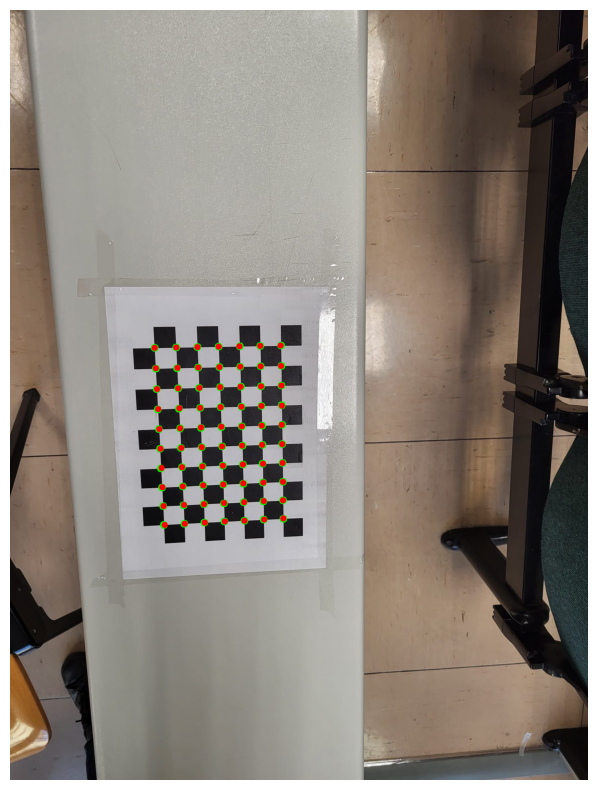

In [295]:
distorted_projected_points = []
u0, v0 = updated_K[0, 2], updated_K[1, 2]
alpha_u = updated_K[0, 0]
sin_theta = 1 / np.sqrt(1 + (updated_K[0,1] / updated_K[0,0]) ** 2)
alpha_v = K[1, 1] * sin_theta

total_reprojection_error_rd = compute_reprojection_error(corners_array[11], updated_projected_points_array[11])

print("Total Reprojection Error:", total_reprojection_error_rd)
print("Green: Measured Points")
print("Red: Projected Points")

compare_points_in_image(chosen_image, corners_array[11], updated_projected_points_array[11])